
****
# Aspiring Mind Employment Outcome 2015 Exploratory Data Analysis

****
**BY : Ishaq Miyawala**
****
**Dataset Info** : The dataset was released by Aspiring Minds(now under as shl groups limited) from the Aspiring Mind Employment Outcome 2015 (AMEO).

*The study was primarily limited  only to students with engineering disciplines.* 

The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. 

***Note**: The preprocessing of these dataset was already out in the AMEO_preprocessing.ipynb notebook*

**Objective** : Performing Exploratory Data Analysis (EDA) by Considering Salary as a target variable.

In [1]:
#importing necessary libraries
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 100)

****

**Importing Preprocessed AMEO Dataset**

****

In [2]:
df = pd.read_csv('ameo_analysis_data.csv')

In [3]:
df.head()

,Salary,SalaryBin,Age,Gender,Designation,Tenure,JobCity,10percentage,10board,12graduation,12percentage,12board,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,420000.0,250k - 500k,25,female,quality assurance,3,bangalore,84.3,state,2007,95.8,state,2,B.Tech/B.E.,CS,78.00,0,Andhra Pradesh,2011,515,585,525,0.635979,445.0,NaN,NaN,0.9737,0.8128,0.5269,1.35490,-0.4455
1,500000.0,250k - 500k,26,male,management,2,other,85.4,cbse,2007,85.0,cbse,2,B.Tech/B.E.,EC,70.06,0,Madhya Pradesh,2012,695,610,780,0.960603,NaN,466.0,NaN,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,325000.0,250k - 500k,23,female,systems engineer,1,chennai,85.0,cbse,2010,68.2,cbse,2,B.Tech/B.E.,CS,70.00,0,Uttar Pradesh,2014,615,545,370,0.450877,395.0,NaN,NaN,0.2718,1.7109,0.1637,-0.86820,0.6721
3,1100000.0,> 1M,26,male,software engineer,4,gurgaon,85.6,cbse,2007,83.6,cbse,1,B.Tech/B.E.,CS,74.64,1,Delhi,2011,635,585,625,0.974396,615.0,NaN,NaN,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,200000.0,< 250k,24,male,project manager,1,bangalore,78.0,cbse,2008,76.8,cbse,2,B.Tech/B.E.,EC,73.90,0,Uttar Pradesh,2012,545,625,465,0.124502,NaN,233.0,NaN,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
df.shape

(3941, 31)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3941 entries, 0 to 3940
Data columns (total 31 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Salary                 3941 non-null   float64
 1   SalaryBin              3941 non-null   object 
 2   Age                    3941 non-null   int64  
 3   Gender                 3941 non-null   object 
 4   Designation            3941 non-null   object 
 5   Tenure                 3941 non-null   int64  
 6   JobCity                3941 non-null   object 
 7   10percentage           3941 non-null   float64
 8   10board                3941 non-null   object 
 9   12graduation           3941 non-null   int64  
 10  12percentage           3941 non-null   float64
 11  12board                3941 non-null   object 
 12  CollegeTier            3941 non-null   int64  
 13  Degree                 3941 non-null   object 
 14  Specialization         3941 non-null   object 
 15  coll

In [6]:
df.columns

Index(['Salary', 'SalaryBin', 'Age', 'Gender', 'Designation', 'Tenure',
       'JobCity', '10percentage', '10board', '12graduation', '12percentage',
       '12board', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA',
       'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [7]:
df.describe()

,Salary,Age,Tenure,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.941000e+03,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3080.000000,1126.000000,888.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000
mean,2.993730e+05,24.577265,1.549607,77.949315,2008.083989,74.477615,1.925653,71.703027,0.301193,2012.604669,501.481604,501.465872,513.490485,0.612958,451.822403,335.885435,406.061937,-0.038109,0.143710,-0.001890,-0.168926,-0.140220
std,1.535777e+05,1.765700,1.156701,9.837333,1.652962,11.009893,0.262367,7.415895,0.458834,1.316247,104.857530,86.745068,121.954451,0.264924,97.202487,81.489883,90.066126,1.025785,0.942427,0.952951,1.007057,1.007399
min,3.500000e+04,18.000000,0.000000,43.000000,1995.000000,40.000000,1.000000,49.070000,0.000000,2007.000000,180.000000,195.000000,120.000000,0.002750,105.000000,133.000000,130.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,1.800000e+05,23.000000,1.000000,71.800000,2007.000000,66.000000,2.000000,66.520000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.413838,385.000000,292.000000,346.000000,-0.726400,-0.287100,-0.604800,-0.868200,-0.669200
50%,3.000000e+05,24.000000,1.000000,79.200000,2008.000000,74.400000,2.000000,71.800000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.649390,455.000000,333.000000,407.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,3.700000e+05,26.000000,2.000000,85.730000,2009.000000,82.600000,2.000000,76.400000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,515.000000,388.000000,469.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.500000e+06,38.000000,24.000000,97.760000,2013.000000,98.700000,2.000000,99.930000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,1.995300,1.904800,2.535400,3.352500,1.822400


**Observations from above table**

1. **75%** of these employeed people have less than **2 years** of tenure in the current company
2. Average age of employed people is around 24 years
3. Average percentage for 10th and 12th are 77.9% and 74.47%
   1. This indicates that people enrolled in amcat generally have higher academic scores
   2. which is also proved by collegeGPA average being 71.7
4. Average score in each AMCAT module is in range of 500-600, where the total marks in each module is 900
5. Average salary is around 3,00,000 INR


In [8]:
cat_columns = df.select_dtypes(include=['object']).columns
cat_columns = np.array(cat_columns)

cont_num_columns = df.select_dtypes(include=['float64', 'int64']).columns
cont_num_columns = np.array(cont_num_columns)
cont_num_columns = np.delete(cont_num_columns, [2, 4, 6, 8, 9])

dis_num_columns = ['Tenure','12graduation','CollegeTier', 'CollegeCityTier', 'GraduationYear']

In [9]:
cat_columns

array(['SalaryBin', 'Gender', 'Designation', 'JobCity', '10board',
       '12board', 'Degree', 'Specialization', 'CollegeState'],
      dtype=object)

In [10]:
cont_num_columns

array(['Salary', 'Age', '10percentage', '12percentage', 'collegeGPA',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'], dtype=object)

In [11]:
dis_num_columns

['Tenure', '12graduation', 'CollegeTier', 'CollegeCityTier', 'GraduationYear']

## Univariate Analysis

### Univariate Analysis for numerical Continuous columns

In [12]:
#non-visual analysis 

def numerical_univariate_analysis(dataframe, numerical_col):
    for col_name in numerical_col:
        print("*"*10, col_name, "*"*10)
        print(dataframe[col_name].agg(['min', 'max', 'mean', 'median', 'std', 'skew']))
        print()

In [13]:
numerical_univariate_analysis(df, cont_num_columns)

********** Salary **********
min       3.500000e+04
max       1.500000e+06
mean      2.993730e+05
median    3.000000e+05
std       1.535777e+05
skew      1.573111e+00
Name: Salary, dtype: float64

********** Age **********
min       18.000000
max       38.000000
mean      24.577265
median    24.000000
std        1.765700
skew       0.886045
Name: Age, dtype: float64

********** 10percentage **********
min       43.000000
max       97.760000
mean      77.949315
median    79.200000
std        9.837333
skew      -0.595759
Name: 10percentage, dtype: float64

********** 12percentage **********
min       40.000000
max       98.700000
mean      74.477615
median    74.400000
std       11.009893
skew      -0.037701
Name: 12percentage, dtype: float64

********** collegeGPA **********
min       49.070000
max       99.930000
mean      71.703027
median    71.800000
std        7.415895
skew       0.169530
Name: collegeGPA, dtype: float64

********** English **********
min       180.000000
max       

In [14]:
#making a function which will plot kde graph for all the continous variables 

def plot_kde_plots(dataframe, columns):
    
    # Determining the number of subplots
    num_columns = len(columns)
    num_rows = (num_columns // 3) if (num_columns % 3 == 0) else (num_columns // 3) + 1

    # Creating subplots
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    axes = axes.flatten()

    #kde
    for i, column in enumerate(columns):
        ax = axes[i]
        sns.kdeplot(dataframe[column], ax=ax, color='red')
        sns.histplot(data=dataframe, x=column, ax=ax, color='skyblue', stat='density') 
        ax.set_title(f'KDE Plot - {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Density')


    plt.show()

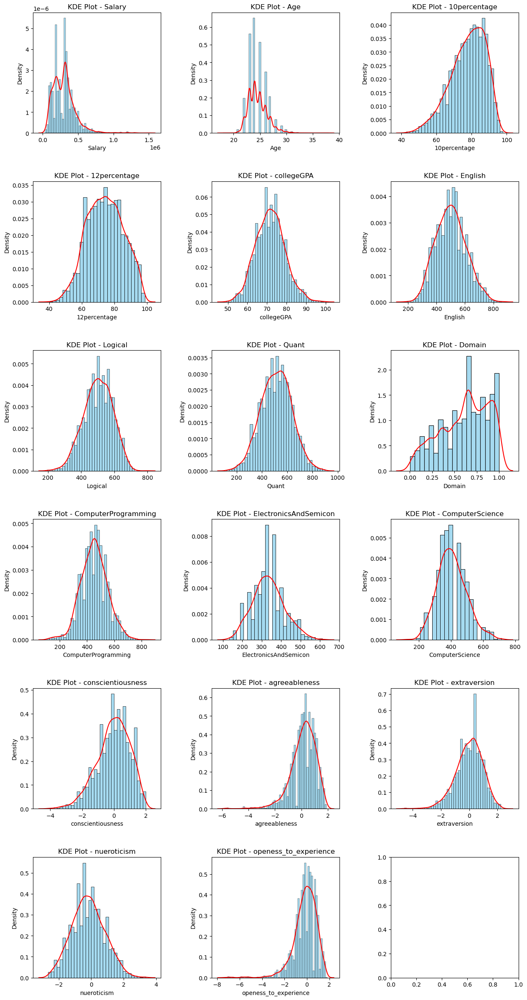

In [15]:
plot_kde_plots(df, cont_num_columns)

Most of the continous numerical features follow normal distribution with some having negative of positive skew

In [16]:
def plot_box_plots(dataframe, columns, hue):
    """
    call function like plot_box_plots(dataframe, columns, hue) 
    """
    # Determining the number of subplots
    num_columns = len(columns)
    num_rows = (num_columns // 3) if (num_columns % 3 == 0) else (num_columns // 3) + 1

    # Creating subplots
    fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    axes = axes.flatten()

    #box plots
    for i, column in enumerate(columns):
        ax = axes[i] 

        sns.boxplot(
            data=dataframe, 
            x=column, 
            ax=ax, 
            hue = hue
        )

        ax.set_title(f'Box Plot - {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')

    plt.show()

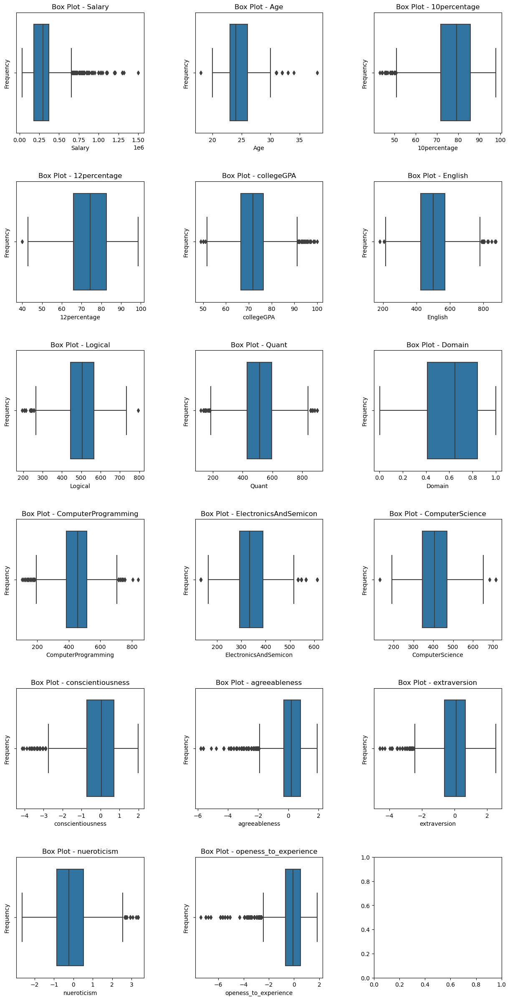

In [17]:
plot_box_plots(df, cont_num_columns, None)

### Univariate Analysis for numerical discrete columns 

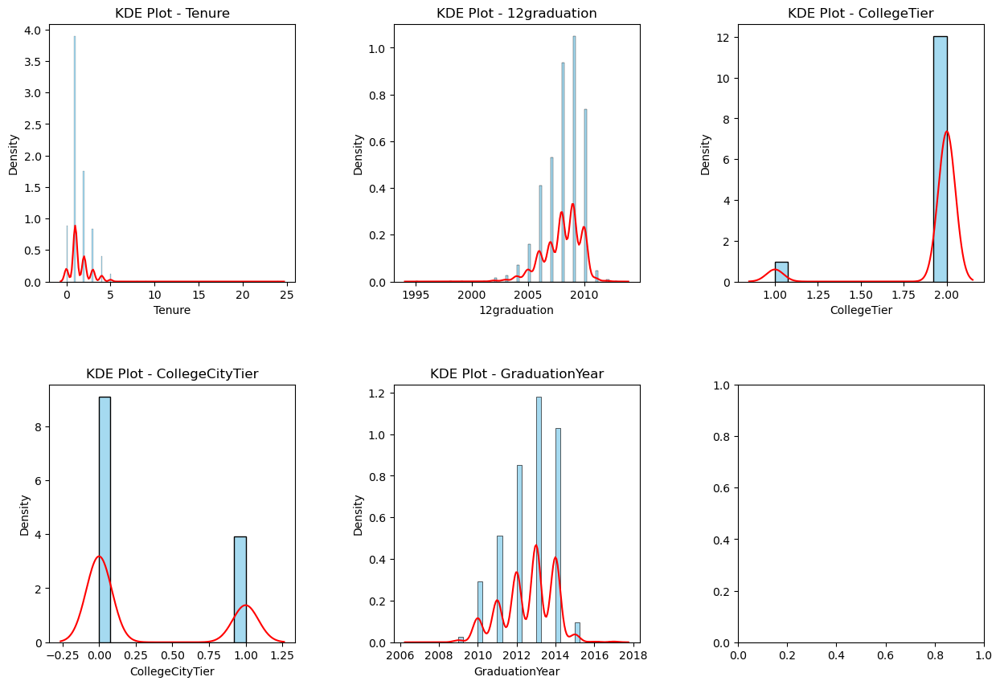

In [18]:
plot_kde_plots(df, dis_num_columns)

In [19]:
def plot_count_plots(dataframe, columns, hue):
    """
    call function like plot_count_plots(dataframe, columns, hue) 
    """
    # Determining the number of subplots
    num_columns = len(columns)
    num_rows = len(columns)

    # Creating subplots
    fig, axes = plt.subplots(num_rows, 1, figsize=(15, 8 * num_rows))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    axes = axes.flatten()

    #box plots
    for i, column in enumerate(columns):
        ax = axes[i] 

        sns.countplot(
            data=dataframe, 
            x=column, 
            ax=ax, 
            hue = hue
        )

        ax.set_title(f'Count Plot - {column}')
        ax.set_xlabel(column)
        ax.set_ylabel('Frequency')

    plt.show()

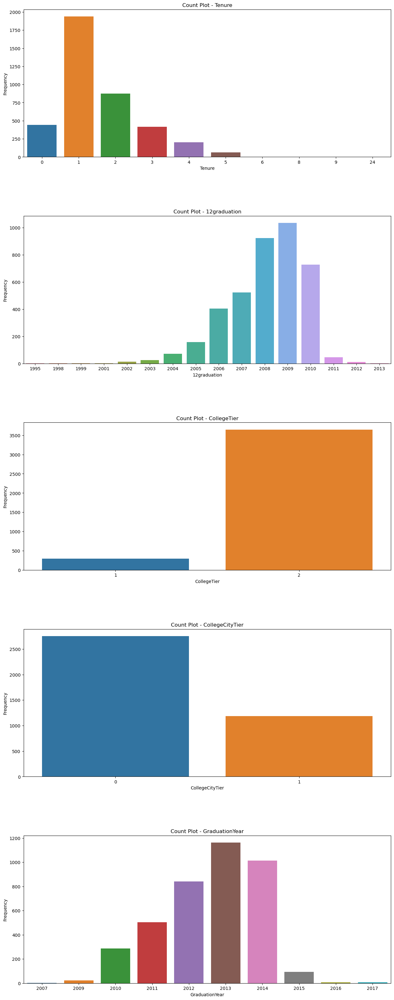

In [20]:
plot_count_plots(df, dis_num_columns, None)

The observations for discrete numerical features are:
1. Most people graduated in 2013
2. Most people have studied in tier-2 college, which is feasible as there are only limited # of tier-1 colleges in India
3. Most people placed via AMCAT are either freshers i.e. just joined the jobs or have 1 year experience

### Univariate Analysis for Categorical columns

In [21]:
def categorical_univariate_analysis(dataframe, categorical_col):
    for col_name in categorical_col:
        print("*"*10, col_name, "*"*10)
        print(dataframe[col_name].agg(['count', 'nunique', 'unique']))
        print()

In [22]:
categorical_univariate_analysis(df, cat_columns)

********** SalaryBin **********
count                                        3941
nunique                                         4
unique     [250k - 500k, > 1M, < 250k, 500k - 1M]
Name: SalaryBin, dtype: object

********** Gender **********
count                3941
nunique                 2
unique     [female, male]
Name: Gender, dtype: object

********** Designation **********
count                                                   3941
nunique                                                   12
unique     [quality assurance, management, systems engine...
Name: Designation, dtype: object

********** JobCity **********
count                                                   3941
nunique                                                   11
unique     [bangalore, other, chennai, gurgaon, hyderabad...
Name: JobCity, dtype: object

********** 10board **********
count                     3941
nunique                      3
unique     [state, cbse, icse]
Name: 10board, dtype: object

***

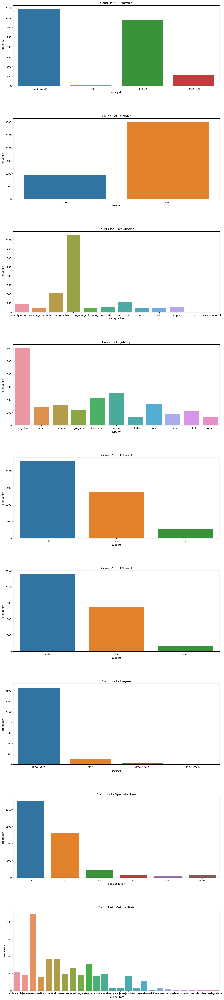

In [23]:
plot_count_plots(df, cat_columns, None)

Obsevations for categorical unvariate analysis are as follows
1. most people have salaries in range 200k - 400k per annum
2. graduates Gender ratio is 3:1 for male:female
3. almost 40% of the graduates work as software engineer or related fields
4. Graduates  working in bengaluru are around 32%
5. Most people gave their 10th and 12th exams in state board
6. Almost 88% of people have completed just bachelors related engineering degree
7. More than 50% people did Computer Science specialization in their degree
8. 24% People Graduated from the colleges based in Uttar Pradesh

In [24]:
list = df.groupby('CollegeState')['Salary'].mean().reset_index()
list.head()

,CollegeState,Salary
0,Andhra Pradesh,306380.090498
1,Assam,452000.000000
2,Bihar,287000.000000
3,Chhattisgarh,261666.666667
4,Delhi,363571.428571


In [25]:
fig = px.choropleth(
    data_frame = list,
    geojson="https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson",
    featureidkey='properties.ST_NM',
    locations='CollegeState',
    color='Salary',
    color_continuous_scale='greens'
)

fig.update_geos(
    visible=False,
    projection=dict(
        type='conic conformal',
        parallels=[12.472944444, 35.172805555556],
        rotation={'lat': 24, 'lon': 80}
    ),
    lonaxis={'range': [68, 98]},
    lataxis={'range': [6, 38]}
)

fig.update_layout(
    title=dict(
        text="State wise Average Salaries",
        xanchor='center',
        x=0.5,
        yref='paper',
        yanchor='bottom',
        y=1,
        pad={'b': 10}
    ),
    margin={'r': 0, 't': 30, 'l': 0, 'b': 0},
    height=550,
    width=550
)

fig.show()

## Bivariate Analysis (Target variable - Salary and Salarybin)

### Categorical vs catagorical Bivariate Analysis

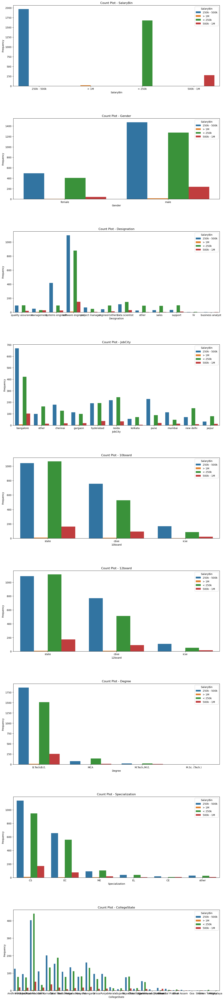

In [26]:
plot_count_plots(df, cat_columns, 'SalaryBin')

Observations on cat. vs cat. analysis

1. There are comparatively more %of male earning between 500k-1M
2. Pune has more people earning between 250k to 500k than people below 250k
3. People who studied in ICSE board and CBSE board have more people earning between 250k-500k where as people who studied in stateboard are more likely to earn below 250k
4. Majority of people have completed their graduation in bachelors


### Numerical vs Numerical Bivariate Analysis

In [27]:
import seaborn as sns 

def plot_scatter_plots(dataframe, numerical_columns, hue):
    """
    call function like plot_scatter_plots(dataframe, columns_to_plot, column as hue)
    """

    # Subplot dimensions
    num_columns = len(numerical_columns)
    num_rows = len(numerical_columns) 

    # Creating subplots
    fig, axes = plt.subplots(num_rows, 1, figsize=(15, 5 * num_rows))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)
    axes = axes.flatten()

    # Scatter plots
    for i, column in enumerate(numerical_columns):
        ax = axes[i]
        sns.scatterplot(
            data=dataframe,
            x=column,
            y="Salary",  
            ax=ax,
            hue=hue
        )
        ax.set_title(f'Scatter Plot - {column} vs Salary')
        ax.set_xlabel(column)
        ax.set_ylabel("Salary")

    plt.show()


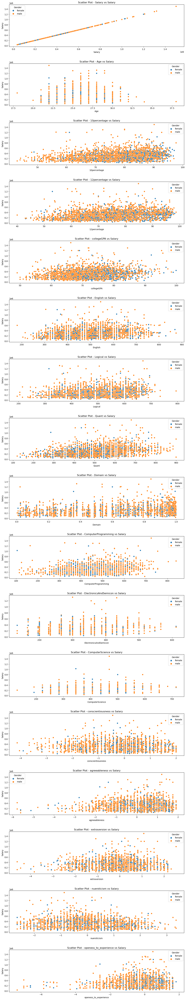

In [28]:
plot_scatter_plots(df, cont_num_columns, 'Gender')

In [29]:
df.columns

Index(['Salary', 'SalaryBin', 'Age', 'Gender', 'Designation', 'Tenure',
       'JobCity', '10percentage', '10board', '12graduation', '12percentage',
       '12board', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA',
       'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

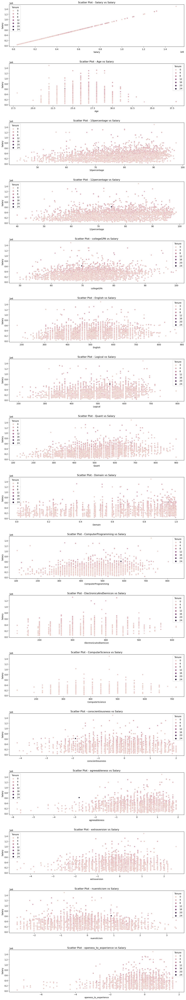

In [30]:
plot_scatter_plots(df, cont_num_columns, 'Tenure')

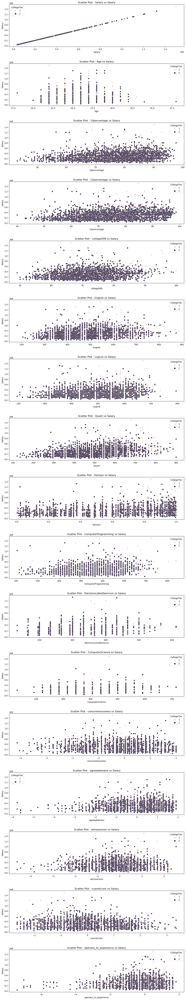

In [31]:
plot_scatter_plots(df, cont_num_columns, 'CollegeTier')

In [32]:
df_dummies = pd.get_dummies(df)
df_dummies.head()

,Salary,Age,Tenure,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,SalaryBin_250k - 500k,SalaryBin_500k - 1M,SalaryBin_< 250k,SalaryBin_> 1M,Gender_female,Gender_male,Designation_business analyst,Designation_data scientist,Designation_engineer(other),Designation_hr,Designation_management,Designation_other,Designation_project manager,Designation_quality assurance,Designation_sales,Designation_software engineer,Designation_support,Designation_systems engineer,JobCity_bangalore,JobCity_chennai,JobCity_gurgaon,JobCity_hyderabad,JobCity_jaipur,JobCity_kolkata,JobCity_mumbai,JobCity_new delhi,JobCity_noida,JobCity_other,JobCity_pune,10board_cbse,10board_icse,10board_state,12board_cbse,12board_icse,12board_state,Degree_B.Tech/B.E.,Degree_M.Sc. (Tech.),Degree_M.Tech./M.E.,Degree_MCA,Specialization_CE,Specialization_CS,Specialization_EC,Specialization_EL,Specialization_ME,Specialization_other,CollegeState_Andhra Pradesh,CollegeState_Assam,CollegeState_Bihar,CollegeState_Chhattisgarh,CollegeState_Delhi,CollegeState_Goa,CollegeState_Gujarat,CollegeState_Haryana,CollegeState_Himachal Pradesh,CollegeState_Jammu and Kashmir,CollegeState_Jharkhand,CollegeState_Karnataka,CollegeState_Kerala,CollegeState_Madhya Pradesh,CollegeState_Maharashtra,CollegeState_Meghalaya,CollegeState_Orissa,CollegeState_Punjab,CollegeState_Rajasthan,CollegeState_Sikkim,CollegeState_Tamil Nadu,CollegeState_Telangana,CollegeState_Union Territory,CollegeState_Uttar Pradesh,CollegeState_Uttarakhand,CollegeState_West Bengal
0,420000.0,25,3,84.3,2007,95.8,2,78.00,0,2011,515,585,525,0.635979,445.0,NaN,NaN,0.9737,0.8128,0.5269,1.35490,-0.4455,True,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,True,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,500000.0,26,2,85.4,2007,85.0,2,70.06,0,2012,695,610,780,0.960603,NaN,466.0,NaN,-0.7335,0.3789,1.2396,-0.10760,0.8637,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,True,False,False,True,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
2,325000.0,23,1,85.0,2010,68.2,2,70.00,0,2014,615,545,370,0.450877,395.0,NaN,NaN,0.2718,1.7109,0.1637,-0.86820,0.6721,True,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False
3,1100000.0,26,4,85.6,2007,83.6,1,74.64,1,2011,635,585,625,0.974396,615.0,NaN,NaN,0.0464,0.3448,-0.3440,-0.40780,-0.9194,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,True,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,200000.0,24,1,78.0,2008,76.8,2,73.90,0,2012,545,625,465,0.124502,NaN,233.0,NaN,-0.8810,-0.2793,-1.0697,0.09163,-0.1295,False,False,True,F

Text(0.5, 1.0, 'Correlation chart w.r.t. Salary')

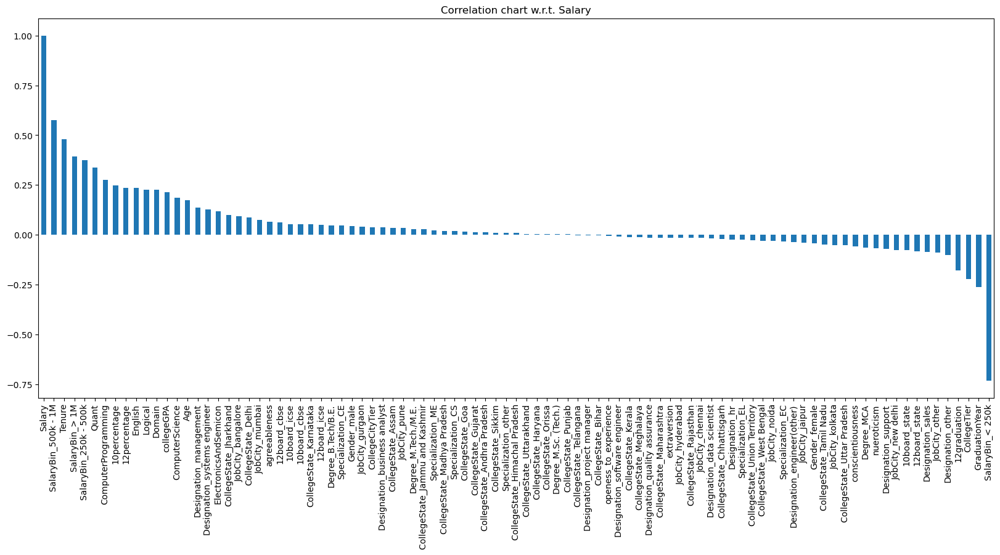

In [33]:
plt.figure(figsize = (20,8))
df_dummies.corr()['Salary'].sort_values(ascending=False).plot(kind='bar')
plt.title('Correlation chart w.r.t. Salary')

features with high correlation with salary 
1. Tenure
2. Quant module
3. Computer Programming
4. 10percentage
5. 12percentage

features with high inverse correlation with salary 
1. GraduationYear
2. CollegeTier
3. Designation - other
4. JobCity - other

Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” 

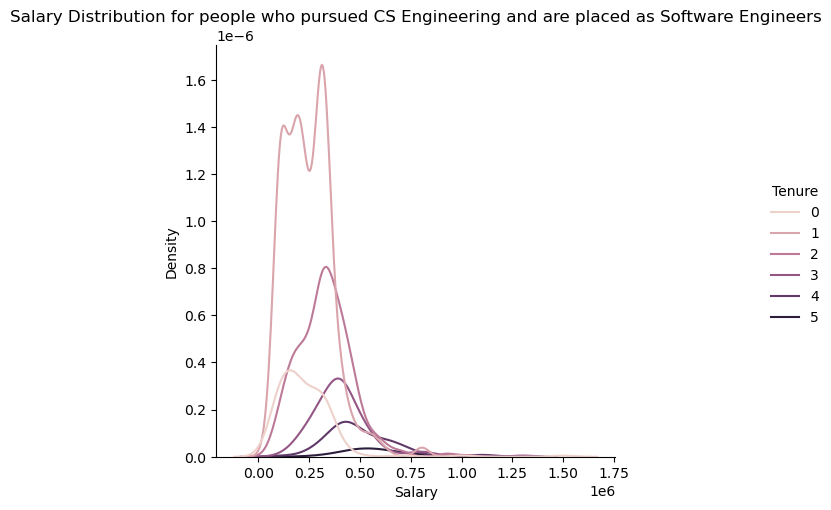

In [34]:
filtered_df = df[(df['Specialization'] == 'CS') & (df['Designation'] == 'software engineer')]


sns.displot(data=filtered_df, x="Salary", kind='kde', hue='Tenure') 

plt.title("Salary Distribution for people who pursued CS Engineering and are placed as Software Engineers")
plt.xlabel("Salary")
plt.ylabel("Density")

plt.show()

Is there a relationship between gender and specialization? (i.e. Does the preference of Specialisation depend on the Gender?)


In [35]:
df.columns

Index(['Salary', 'SalaryBin', 'Age', 'Gender', 'Designation', 'Tenure',
       'JobCity', '10percentage', '10board', '12graduation', '12percentage',
       '12board', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA',
       'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

<Axes: xlabel='Specialization', ylabel='count'>

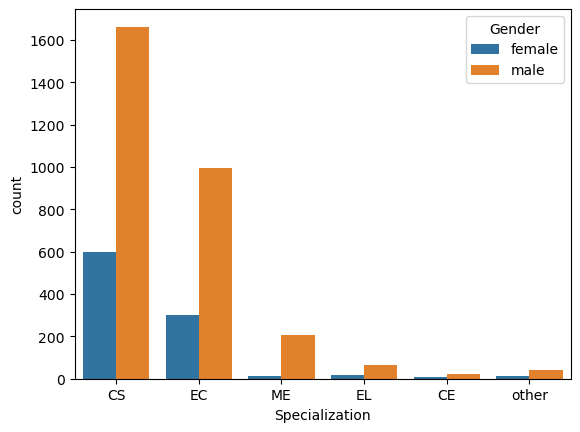

In [36]:
sns.countplot(df, x = 'Specialization', hue = 'Gender')

In [37]:
df.groupby('Gender')['Specialization'].value_counts().unstack()

Specialization,CE,CS,EC,EL,ME,other
Gender,,,,,,
female,6,598,299,16,11,15
male,23,1663,995,66,206,43


In [38]:
df.groupby('Gender')['Specialization'].value_counts(normalize=True).unstack()*100

Specialization,CE,CS,EC,EL,ME,other
Gender,,,,,,
female,0.634921,63.280423,31.640212,1.693122,1.164021,1.587302
male,0.767690,55.507343,33.210948,2.202937,6.875834,1.435247
